# FPP optimization workflow 

In [241]:
using Revise
using FUSE
using IMAS
using Plots;
FUSE.logging(Logging.Info; actors=Logging.Debug);

## Make new FPP equilibirum from scratch

### Initialize from FPP v1 demount

In [242]:
dd = IMAS.dd()
ini, act = FUSE.case_parameters(:FPP, version=:v2);

### Modify ini

In [243]:
ini.equilibrium.R0 = 5.0
ini.equilibrium.B0 = 6.0
ini.equilibrium.ip = 7.5e6
ini.equilibrium.ϵ = missing # 1/3.5
ini.equilibrium.κ = missing # 2.1
ini.equilibrium.δ = missing # 0.6
ini.equilibrium.ζ = 0.0
ini.equilibrium.pressure_core = 1.25e6
ini.equilibrium.field_null_surface = 0.8
ini.equilibrium.xpoints = :lower

ini.core_profiles.impurity = :Kr
ini.core_profiles.n_shaping = 1.25 #2.5
ini.core_profiles.T_shaping = 1.25 #2.5
ini.core_profiles.T_ratio = 0.825

ini.core_profiles.greenwald_fraction = 1.1
ini.core_profiles.greenwald_fraction_ped = 0.55

ini.core_profiles.ne_ped = missing
ini.core_profiles.helium_fraction = 0.04
ini.core_profiles.zeff = 1.75

ini.ec_launcher[1].power_launched = 35.0e6 #W

mhx_order = 5
R0 = ini.equilibrium.R0
eps = 1/3.5
a = R0*eps
kapu = 2.0
kapl = 2.2
delu = 0.5
dell = 0.7
zetaou = -0.0
zetaol = -0.4
zetaiu = -0.0
zetail = -0.2
upnull = false
lonull = true

r, z, zref = try
    IMAS.boundary_shape(; a, eps, kapu, kapl, delu, dell, zetaou, zetaiu, zetaol, zetail, zoffset=0.0, upnull, lonull)
catch e
    [NaN], [NaN], [NaN]
end

mxh = IMAS.MXH(r, z, mhx_order)
mxh_vect = IMAS.flat_coeffs(mxh)

ini.equilibrium.boundary_from = :MXH_params
ini.equilibrium.MXH_params = mxh_vect

#plot(r, z; aspect_ratio=:equal, lw=2, label="numerical")
#display(plot!(mxh,label="MXH"))
#display(mxh)

ini.build.plasma_gap = 0.125
ini.build.divertors = :lower
ini.build.symmetric = false
ini.build.n_first_wall_conformal_layers = 2

ini.pf_active.n_coils_outside = 6
ini.pf_active.n_coils_inside = 0
ini.pf_active.technology = :Nb3Sn
ini.tf.shape = :princeton_D #_scaled
ini.oh.n_coils = 6

ini.requirements.flattop_duration = 24*3600.0

86400.0

In [244]:
R0 = ini.equilibrium.R0
ϵ = eps
a = R0*ϵ

RiPlasma = R0 - a

layers = FUSE.OrderedCollections.OrderedDict{String,Float64}()

# HFS layers

layers["plasma"] = 2*a*(1+ini.build.plasma_gap)
layers["hfs first wall"] = 0.02
layers["hfs blanket"] = 0.55*((1/ϵ-1.8)/2.2)^0.5
layers["hfs high temp shield"] = RiPlasma*0.05
layers["hfs gap high temp shield vacuum vessel"] = RiPlasma * 0.02
layers["hfs vacuum vessel"] = RiPlasma * 0.05
layers["hfs gap vacuum vessel low temp shield"] = RiPlasma * 0.02
layers["hfs low temp shield"] = 0.45-0.15*((1/ϵ-1.8)/2.2)^0.5
layers["hfs gap low temp shield TF"] = RiPlasma * 0.02

rbCenterPost = (R0 - 0.5*layers["plasma"] - layers["hfs first wall"] - layers["hfs blanket"]
    - layers["hfs high temp shield"] - layers["hfs gap high temp shield vacuum vessel"]
    - layers["hfs vacuum vessel"] - layers["hfs gap vacuum vessel low temp shield"]
    - layers["hfs low temp shield"] - layers["hfs gap low temp shield TF"]);

layers["hfs TF"] = rbCenterPost * 0.25
layers["OH"] = rbCenterPost * 0.25
layers["gap TF OH"] = RiPlasma * 0.02
layers["gap OH"] = rbCenterPost - layers["hfs TF"] - layers["gap TF OH"] - layers["OH"]

# LFS layers

layers["lfs first wall"] = 0.02
layers["lfs blanket"] = 1.0 - 0.25*((1/ϵ-2.1)/1.9)^0.5
layers["lfs high temp shield"] = RiPlasma * 0.05
layers["lfs gap high temp shield vacuum vessel"] = RiPlasma * 0.4
layers["lfs vacuum vessel"] = RiPlasma * 0.05
layers["lfs gap vacuum vessel low temp shield"] = RiPlasma * 0.02
layers["lfs low temp shield"] = 0.45-0.15*((1/ϵ-1.8)/2.2)^0.5
layers["lfs gap low temp shield TF"] = RiPlasma * 0.02
layers["lfs TF"] = layers["hfs TF"]
layers["gap cryostat"] = RiPlasma * 0.6
layers["cryostat"] = 0.2

for layer in ini.build.layers
    layer.thickness = layers[layer.name]
    if occursin("vacuum vessel", layer.name) || occursin("shield", layer.name) || occursin("blanket", layer.name)
        layer.shape = :rectangle_ellipse
    end
end


### Modify act

In [245]:
act.ActorEquilibrium.model = :TEQUILA
act.ActorEquilibrium.symmetrize = false

act.ActorECsimple.rho_0 = [0.65]
act.ActorECsimple.width = [0.025]

act.ActorPedestal.update_core_profiles = false
act.ActorPedestal.only_powerlaw = false
act.ActorPedestal.T_ratio_pedestal = 1.0

act.ActorHFSsizing.do_plot = true
act.ActorHFSsizing.verbose = true
act.ActorHFSsizing.j_tolerance = 0.5
act.ActorHFSsizing.stress_tolerance = 0.01
act.ActorHFSsizing.error_on_technology = false
act.ActorHFSsizing.error_on_performance = false
act.ActorFluxSwing.operate_oh_at_j_crit = true

act.ActorLFSsizing.maintenance = :vertical
act.ActorLFSsizing.tor_modularity = 2
act.ActorLFSsizing.pol_modularity = 1
act.ActorLFSsizing.verbose = true

act.ActorPFactive.do_plot = true
act.ActorPFactive.update_equilibrium = false
act.ActorCXbuild.rebuild_wall = false

act.ActorPFdesign.do_plot = true
act.ActorPFdesign.symmetric = false

act.ActorPowerNeeds.model = :thermal_power_fraction
act.ActorPowerNeeds.thermal_power_fraction = 0.2

act.ActorThermalCycle.power_cycle_type = :fixed_cycle_efficiency
act.ActorThermalCycle.fixed_cycle_efficiency = 0.4

act.ActorStabilityLimits.raise_on_breach = false

act.ActorCosting.model = :GASC
act.ActorCosting.production_increase = 10.0
act.ActorCosting.learning_rate = 0.616

act.ActorFixedProfiles.T_shaping = ini.core_profiles.T_shaping
act.ActorFixedProfiles.n_shaping = ini.core_profiles.n_shaping
act.ActorFixedProfiles.T_ratio_pedestal = 1.0
act.ActorFixedProfiles.T_ratio_core = ini.core_profiles.T_ratio
act.ActorFixedProfiles.update_pedestal = true
act.ActorFixedProfiles.n_ITB_height = 0.7
act.ActorFixedProfiles.T_ITB_height = 0.4
act.ActorFixedProfiles.ITB_width = 0.05
act.ActorFixedProfiles.ITB_radius = 0.6

act.ActorCoreTransport.model = :FixedProfiles

act.ActorStationaryPlasma.convergence_error = 5e-3
act.ActorStationaryPlasma.max_iter = 8
act.ActorStationaryPlasma.do_plot = true

act.ActorTEQUILA.debug = false
act.ActorTEQUILA.relax = 0.8
act.ActorTEQUILA.number_of_radial_grid_points = 21
act.ActorTEQUILA.number_of_MXH_harmonics = 6

#act.ActorTEQUILA.number_of_iterations = 50
#act.ActorTEQUILA.tolerance = 0.0001
#act.ActorTEQUILA.ip_from = :pulse_schedule

act.ActorTGLF.user_specified_model = "sat1_em_fpp"

"sat1_em_fpp"

## Run WholeFacility Actor

[ Info: Equilibrium
[ Info:  TEQUILA


[ Info: HCD
[ Info:  ECsimple
[ Info:  ICsimple
[ Info:  LHsimple
[ Info:  NBsimple
[ Info: SteadyStateCurrent


[ Info: CXbuild


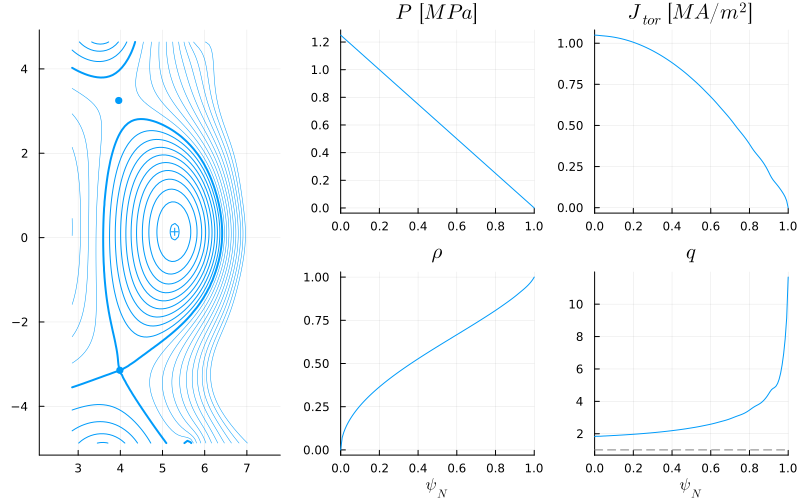

0.03130440688248903

In [246]:
dd = IMAS.dd()
FUSE.init(dd, ini, act; do_plot=false);
mxh_plot = plot(dd.equilibrium, show_x_points=true)
display(mxh_plot)
eq = dd.equilibrium.time_slice[]
dRsep = maximum(eq.boundary_secondary_separatrix.outline.r) - maximum(eq.boundary.outline.r)

In [247]:
# modify secondary X point

XP2_R = 4.0
XP2_Z = 4.0

dd.pulse_schedule.position_control.x_point[1].r.reference.data .= XP2_R
dd.pulse_schedule.position_control.x_point[1].z.reference.data .= XP2_Z

display(dd.pulse_schedule.position_control.x_point)

# modify outer strike point

if false
    OSP_R = 4.5
    OSP_Z = -3.75

    pc = dd.pulse_schedule.position_control
    time0 = 100.0

    resize!(pc.strike_point, 1; wipe=false)

    IMAS.set_time_array(pc.strike_point[1].r.reference, :data, time0, OSP_R)
    IMAS.set_time_array(pc.strike_point[1].z.reference, :data, time0, OSP_Z)

    display(dd.pulse_schedule.position_control.strike_point)
end

x_point
├─ 1
│  ├─ r
│  │  └─ reference
│  │     ├─ data ➡ [4,4,4] [mixed]
│  │     └─ time ➡ [-Inf,100,Inf] [s]
│  └─ z
│     └─ reference
│        ├─ data ➡ [4,4,4] [mixed]
│        └─ time ➡ [-Inf,100,Inf] [s]
└─ 2
   ├─ r
   │  └─ reference
   │     ├─ data ➡ [3.98931,3.98931,3.98931] [mixed]
   │     └─ time ➡ [-Inf,100,Inf] [s]
   └─ z
      └─ reference
         ├─ data ➡ [-3.14225,-3.14225,-3.14225] [mixed]
         └─ time ➡ [-Inf,100,Inf] [s]


[ Info: WholeFacility
[ Info:  StationaryPlasma


Jtor0_before = 0.77 MA/m²
P0_before = 1338.53 kPa
βn_MHD = 4.31
βn_tot = 2.75
Te_ped = 2.70e+03 eV
rho_ped = 0.9500


[ Info:   HCD
[ Info:    ECsimple
[ Info:    ICsimple
[ Info:    LHsimple
[ Info:    NBsimple
[ Info:   Current
[ Info:    SteadyStateCurrent
[ Info:   CoreTransport
[ Info:    FixedProfiles
[ Info:     Pedestal


[ Info:   HCD
[ Info:    ECsimple
[ Info:    ICsimple
[ Info:    LHsimple


[ Info:    NBsimple
[ Info:   Current
[ Info:    SteadyStateCurrent
[ Info:   Equilibrium
[ Info:    TEQUILA



Jtor0_after = 0.52 MA m^2
   P0_after = 1338.54 kPa
     βn_MHD = 3.39
     βn_tot = 3.27
     Te_ped = 2.72e+03 eV
    rho_ped = 0.9396


[ Info: Iteration = 1 , convergence error = 0.23787, threshold = 0.005
[ Info:   CoreTransport
[ Info:    FixedProfiles
[ Info:     Pedestal
[ Info:   HCD
[ Info:    ECsimple
[ Info:    ICsimple
[ Info:    LHsimple
[ Info:    NBsimple
[ Info:   Current


[ Info:    SteadyStateCurrent
[ Info:   Equilibrium
[ Info:    TEQUILA



Jtor0_after = 0.21 MA m^2
   P0_after = 1338.54 kPa
     βn_MHD = 3.38
     βn_tot = 3.27
     Te_ped = 2.14e+03 eV
    rho_ped = 0.9585


[ Info: Iteration = 2 , convergence error = 0.07218, threshold = 0.005
[ Info:   CoreTransport
[ Info:    FixedProfiles
[ Info:     Pedestal
[ Info:   HCD
[ Info:    ECsimple
[ Info:    ICsimple
[ Info:    LHsimple
[ Info:    NBsimple
[ Info:   Current
[ Info:    SteadyStateCurrent


[ Info:   Equilibrium
[ Info:    TEQUILA



Jtor0_after = 0.27 MA m^2
   P0_after = 1338.54 kPa
     βn_MHD = 3.02
     βn_tot = 3.25
     Te_ped = 2.27e+03 eV
    rho_ped = 0.9553


[ Info: Iteration = 3 , convergence error = 0.04203, threshold = 0.005
[ Info:   CoreTransport
[ Info:    FixedProfiles
[ Info:     Pedestal
[ Info:   HCD
[ Info:    ECsimple
[ Info:    ICsimple
[ Info:    LHsimple
[ Info:    NBsimple
[ Info:   Current
[ Info:    SteadyStateCurrent


[ Info:   Equilibrium
[ Info:    TEQUILA



Jtor0_after = 0.49 MA m^2
   P0_after = 1338.54 kPa
     βn_MHD = 3.21
     βn_tot = 3.26
     Te_ped = 2.38e+03 eV
    rho_ped = 0.9511


[ Info: Iteration = 4 , convergence error = 0.02886, threshold = 0.005
[ Info:   CoreTransport
[ Info:    FixedProfiles
[ Info:     Pedestal
[ Info:   HCD
[ Info:    ECsimple
[ Info:    ICsimple
[ Info:    LHsimple
[ Info:    NBsimple
[ Info:   Current
[ Info:    SteadyStateCurrent


[ Info:   Equilibrium
[ Info:    TEQUILA



Jtor0_after = 0.40 MA m^2
   P0_after = 1338.54 kPa
     βn_MHD = 3.22
     βn_tot = 3.26
     Te_ped = 2.35e+03 eV
    rho_ped = 0.9533


[ Info: Iteration = 5 , convergence error = 0.02095, threshold = 0.005
[ Info:   CoreTransport
[ Info:    FixedProfiles
[ Info:     Pedestal
[ Info:   HCD
[ Info:    ECsimple
[ Info:    ICsimple
[ Info:    LHsimple
[ Info:    NBsimple
[ Info:   Current
[ Info:    SteadyStateCurrent


[ Info:   Equilibrium
[ Info:    TEQUILA


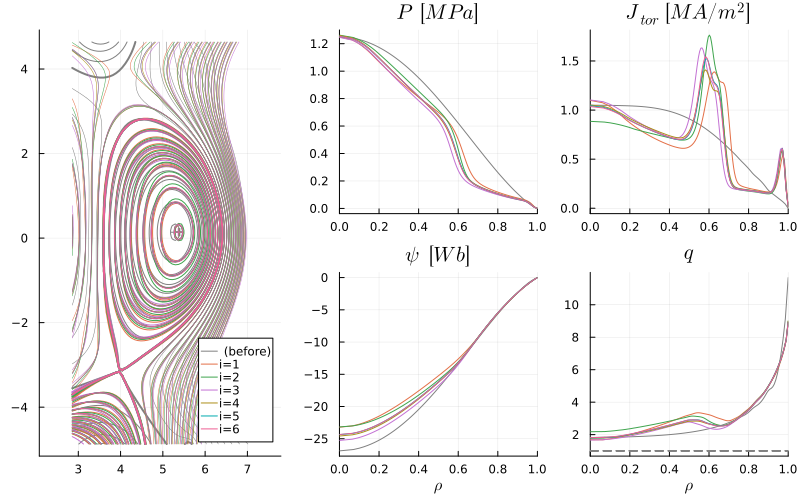

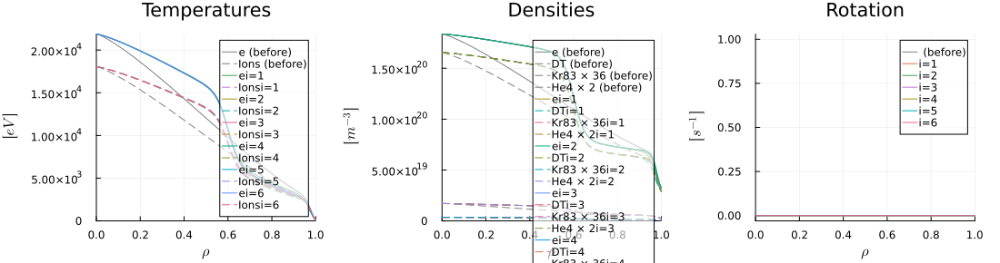

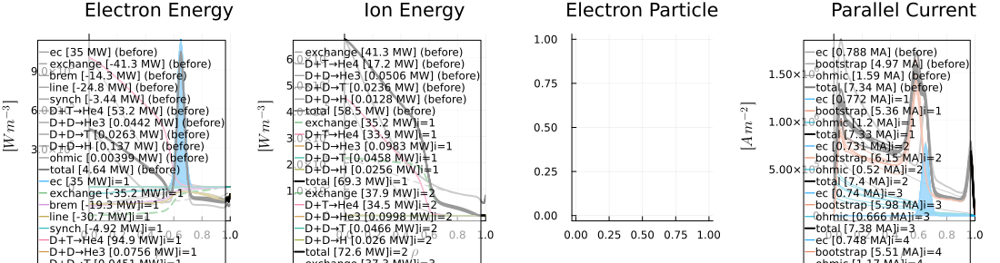


Jtor0_after = 0.38 MA m^2
   P0_after = 1338.54 kPa
     βn_MHD = 3.21
     βn_tot = 3.26
     Te_ped = 2.33e+03 eV
    rho_ped = 0.9535


[ Info: Iteration = 6 , convergence error = 0.00395, threshold = 0.005


[ Info:  StabilityLimits
[ Info:  FluxSwing
[ Info:  Stresses
[ Info:  Neutronics


[ Info:  Blanket


[ Info:   CXbuild


[ Info:  Divertors
[ Info:  BalanceOfPlant
[ Info:   HeatTransfer
[ Info:   ThermalCycle


[ Info:   PowerNeeds
[ Info:  Costing


[ Info:   GASCCosting
[ Info:    SheffieldCosting
┌ Warning: Inflation data not available for 2010
└ @ FUSE ~/.julia/dev/FUSE/src/actors/costing/costing_utils.jl:122


┌ Warning: Inflation data not available for 1983
└ @ FUSE ~/.julia/dev/FUSE/src/actors/costing/costing_utils.jl:122
┌ Warning: Inflation data not available for 1983
└ @ FUSE ~/.julia/dev/FUSE/src/actors/costing/costing_utils.jl:122
┌ Warning: Inflation data not available for 1983
└ @ FUSE ~/.julia/dev/FUSE/src/actors/costing/costing_utils.jl:122


In [248]:
FUSE.ActorWholeFacility(dd, act, update_build=false);

## Summary

In [249]:
show(FUSE.timer)

 ────────────────────────────────────────────────────────────────────────────────
                                        Time                    Allocations      
                               ───────────────────────   ────────────────────────
       Tot / % measured:            92.1h /   0.0%            149GiB /   4.0%    

 Section               ncalls     time    %tot     avg     alloc    %tot      avg
 ────────────────────────────────────────────────────────────────────────────────
 WholeFacility              2    42.3s   86.8%   21.2s   3.50GiB   58.2%  1.75GiB
   StationaryPlasma         2    38.5s   79.0%   19.3s   2.86GiB   47.6%  1.43GiB
     Equilibrium           12    35.4s   72.7%   2.95s   2.62GiB   43.6%   224MiB
       TEQUILA             12    34.7s   71.1%   2.89s   2.37GiB   39.4%   202MiB
     HCD                   14    304ms    0.6%  21.7ms   29.9MiB    0.5%  2.13MiB
       ECsimple            14   62.1ms    0.1%  4.43ms   6.44MiB    0.1%   471KiB
       ICsimple

    0.2%  76.0ms   7.37MiB    0.1%  7.37MiB
     HCD                    2   50.4ms    0.1%  25.2ms   4.28MiB    0.1%  2.14MiB
       NBsimple             2   10.6ms    0.0%  5.30ms    853KiB    0.0%   427KiB
       ECsimple             2   9.64ms    0.0%  4.82ms    960KiB    0.0%   480KiB
       LHsimple             2   9.49ms    0.0%  4.74ms    854KiB    0.0%   427KiB
       ICsimple             2   8.60ms    0.0%  4.30ms    854KiB    0.0%   427KiB
   init_currents            1   25.6ms    0.1%  25.6ms   4.26MiB    0.1%  4.26MiB
     SteadyStateCur...      2   23.5ms    0.0%  11.7ms   4.10MiB    0.1%  2.05MiB
   init_core_profiles       1   2.14ms    0.0%  2.14ms    526KiB    0.0%   526KiB
   init_requirements        1   66.4μs    0.0%  66.4μs   34.7KiB    0.0%  34.7KiB
   init_missing_fro...      1   2.40μs    0.0%  2.40μs     56.0B    0.0%    56.0B
 FluxCalculator             2    286ms    0.6%   143ms   42.5MiB    0.7%  21.3MiB
   TGLF                     2    117ms    0.2%  58.4ms

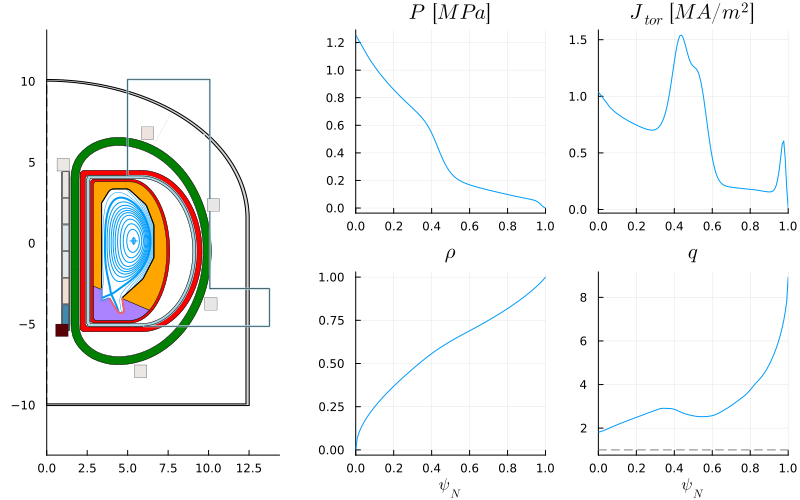

GEOMETRY                         EQUILIBRIUM                      TEMPERATURES                     DENSITIES                        
─────────────────────────────    ─────────────────────────────    ─────────────────────────────    ─────────────────────────────    
R0 → 5 [m]                       B0 → 6 [T]                       Te0 → 21.9 [keV]                 ne0 → 1.84e+20 [m⁻³]             
a → 1.43 [m]                     ip → 7.39 [MA]                   Ti0 → 18.1 [keV]                 ne_ped → 6.36e+19 [m⁻³]          
1/ϵ → 3.5                        q95 → 6.01                       <Te> → 9.56 [keV]                <ne> → 1.12e+20 [m⁻³]            
κ → 2.1                          <Bpol> → 0.629 [T]               <Ti> → 8.17 [keV]                ne0/<ne> → 1.64                  
δ → 0.506                        βpol_MHD → 2.36                  Te0/<Te> → 2.29                  fGW → 1.2                        
ζ → -0.0605                      βtor_MHD → 0.0282                Ti0

24×9 DataFrame
 Row │ group   details     type      ΔR         R_start    R_end      material      area        volume     
     │ String  String      String    Float64    Float64    Float64    String        Float64     Float64    
─────┼─────────────────────────────────────────────────────────────────────────────────────────────────────
   1 │ in                            0.928506    0.0        0.928506                  9.09331     26.5251
   2 │ in                  oh        0.499968    0.928506   1.42847   ReBCO           4.89643     36.2565
   3 │ in                            0.0714309   1.42847    1.49991                   0.699557     6.43577
   4 │ hfs                 tf        0.499968    1.49991    1.99987   ReBCO          18.0565     226.89
   5 │ hfs                           0.0714309   1.99987    2.0713                   16.2769     539.002
   6 │ hfs     low temp    shield    0.318153    2.0713     2.38946   Steel           9.31369    310.107
   7 │ hfs                  

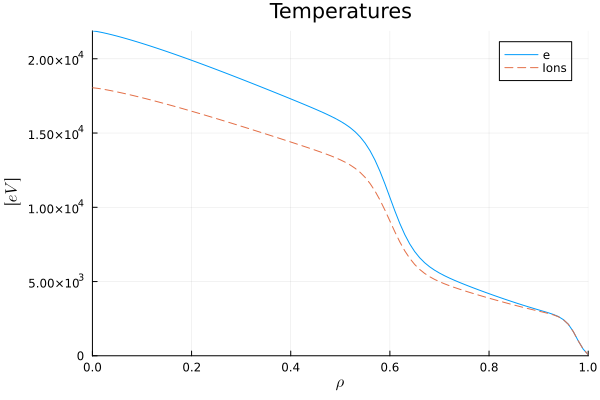

​
​


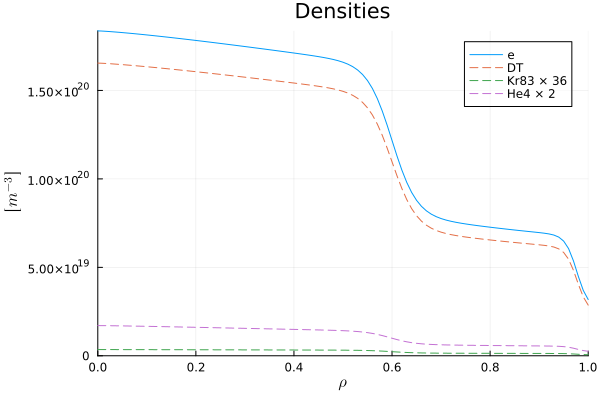

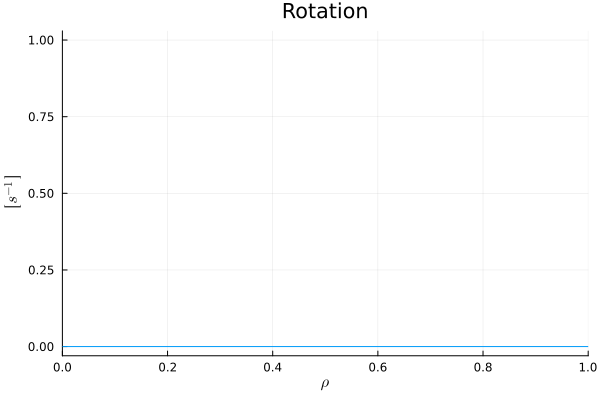

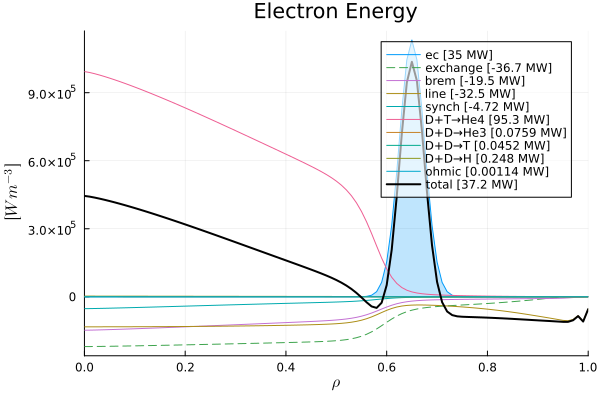

​
​
​


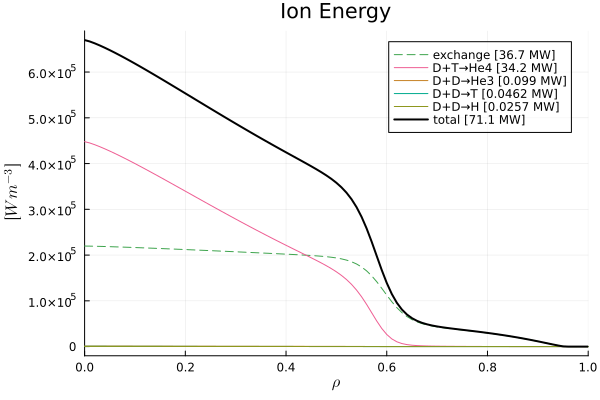

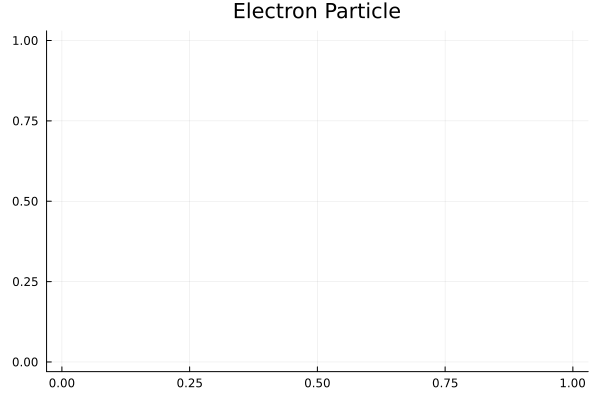

​
​


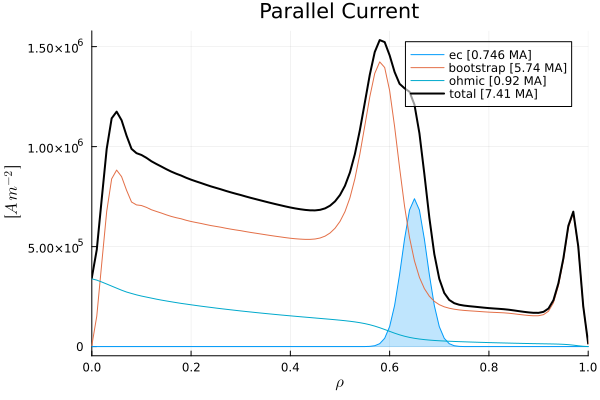

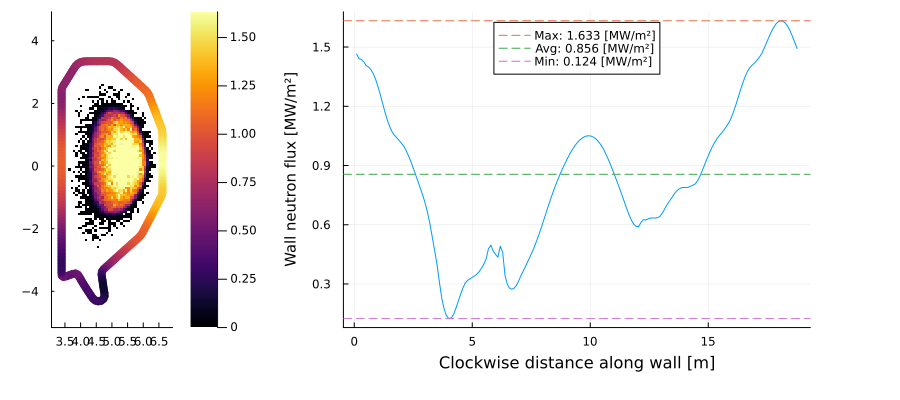

​
​


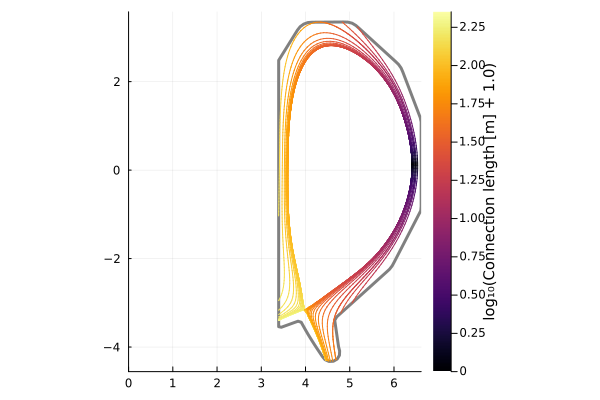

​


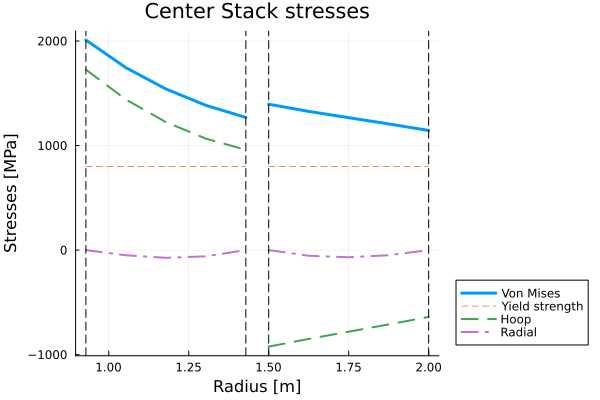

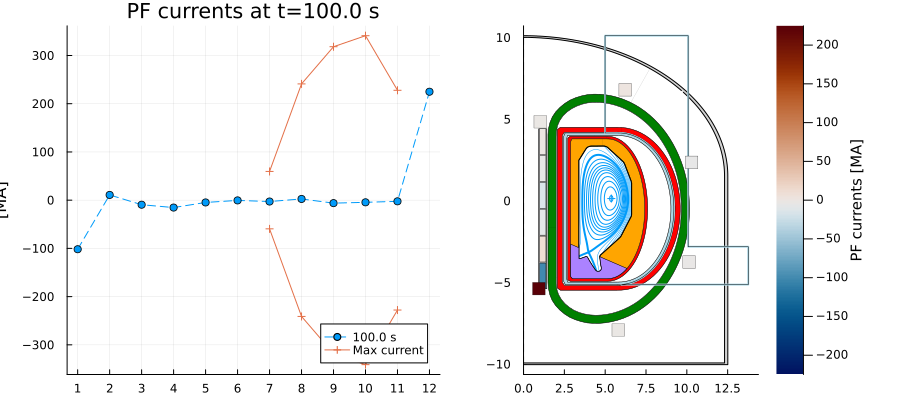

​
​


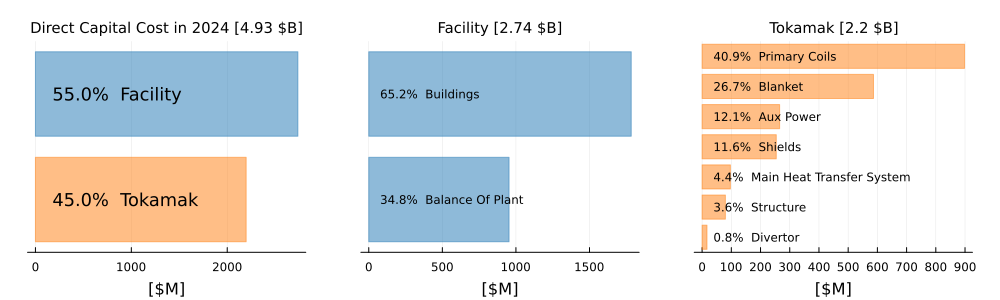

​


In [250]:
FUSE.digest(dd)

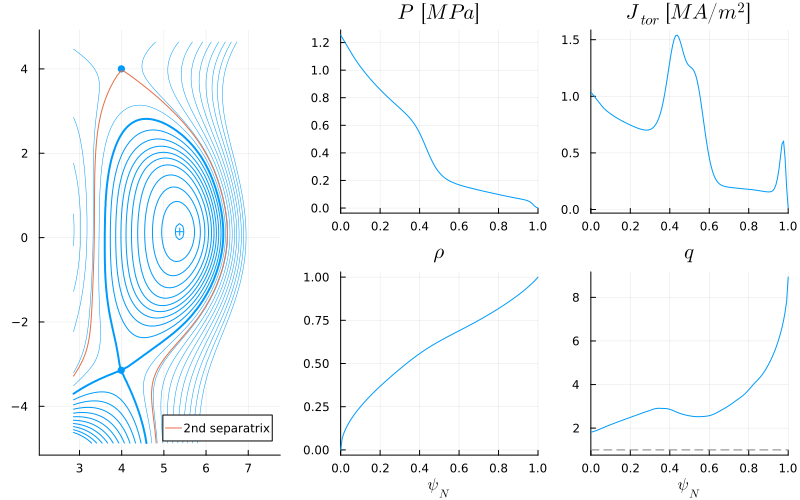

0.09472445188257606

In [251]:
eq = dd.equilibrium.time_slice[]

plot(eq, show_x_points=true)
display(plot!(eq.boundary_secondary_separatrix.outline.r,eq.boundary_secondary_separatrix.outline.z,label="2nd separatrix"))

dRsep = maximum(eq.boundary_secondary_separatrix.outline.r) - maximum(eq.boundary.outline.r)

In [252]:
if false
    savedir = "FPP_build_TEQUILA_MXH/"
    FUSE.save(savedir,dd,ini,act)
end

In [253]:
act.ActorTGLF

ActorTGLF{Float64}
├─ nn{Bool} ➡ true Use TGLF-NN
├─ sat_rule{Symbol} ➡ :sat1 Saturation rule [:sat0, :sat0quench, :sat1, :sat1geo, :sat2]
├─ electromagnetic{Bool} ➡ true Electromagnetic or electrostatic
├─ user_specified_model{String} ➡ "sat1_em_fpp" Use a user specified TGLF-NN model stored in TGLFNN/models
├─ rho_transport{AbstractVector{Float64}} ➡ 0.25:0.1:0.85 rho_tor_norm values to compute tglf fluxes on
├─ warn_nn_train_bounds{Bool} ➡ false Raise warnings if querying cases that are certainly outside of the training range
└─ theta_trapped{Float64} ➡ 0.7 Theta trapped parameter for TGLF


[ Info: FluxCalculator
[ Info:  TGLF
[ Info:  Neoclassical


┌ Warning: No strict ticks found
└ @ PlotUtils ~/.julia/packages/PlotUtils/mHQ0Q/src/ticks.jl:191
┌ Warning: No strict ticks found
└ @ PlotUtils ~/.julia/packages/PlotUtils/mHQ0Q/src/ticks.jl:191
┌ Warning: No strict ticks found
└ @ PlotUtils ~/.julia/packages/PlotUtils/mHQ0Q/src/ticks.jl:191
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots ~/.julia/packages/Plots/sxUvK/src/utils.jl:106
┌ Warning: No strict ticks found
└ @ PlotUtils ~/.julia/packages/PlotUtils/mHQ0Q/src/ticks.jl:191
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots ~/.julia/packages/Plots/sxUvK/src/utils.jl:106
┌ Warning: Invalid negative or zero value -2.441360034467306 found at series index 1 for log10 based yscale
└ @ Plots ~/.julia/packages/Plots/sxUvK/src/utils.jl:106
┌ Warning: Invalid negative or zero value -2.441360034467306 found at series index 1 for log10 based yscale
└ @ Plots ~/.julia/packages/Plots/s

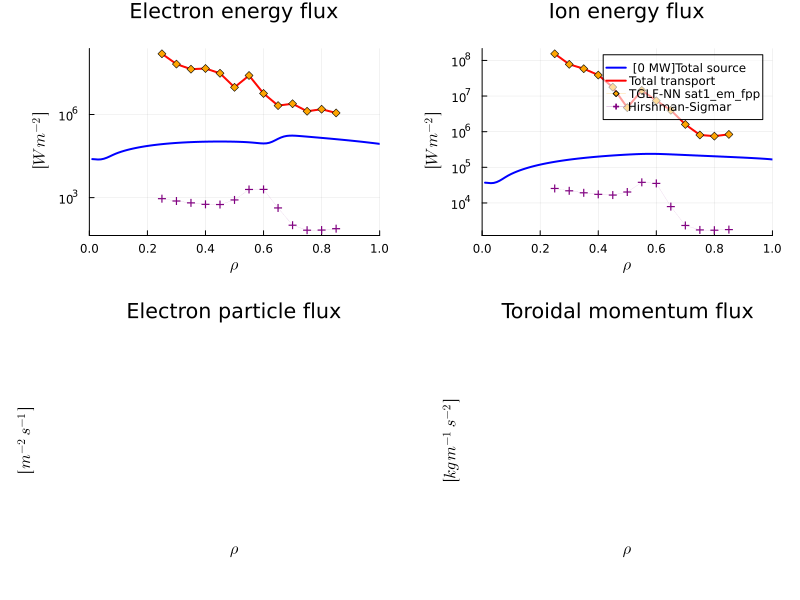

┌ Warning: No strict ticks found
└ @ PlotUtils ~/.julia/packages/PlotUtils/mHQ0Q/src/ticks.jl:191
┌ Warning: Invalid negative or zero value 0.0 found at series index 1 for log10 based yscale
└ @ Plots ~/.julia/packages/Plots/sxUvK/src/utils.jl:106
┌ Warning: Invalid negative or zero value -2.441360034467306 found at series index 1 for log10 based yscale
└ @ Plots ~/.julia/packages/Plots/sxUvK/src/utils.jl:106
┌ Warning: Invalid negative or zero value -2.441360034467306 found at series index 1 for log10 based yscale
└ @ Plots ~/.julia/packages/Plots/sxUvK/src/utils.jl:106


In [254]:
FUSE.ActorFluxCalculator(dd, act; rho_transport=0.25:0.05:0.85);
p = plot(dd.core_transport, yaxis=:log)
display(p)

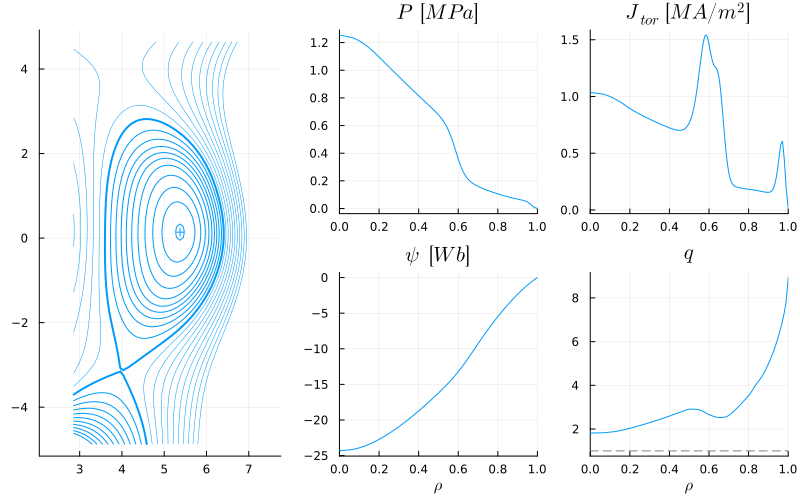

In [255]:
plot(dd.equilibrium, coordinate=:rho_tor_norm)

profiles_1d
├─ current_parallel_inside ➡ 101-element Vector{Float64} [A]
├─ electrons
│  ├─ energy ➡ 101-element Vector{Float64} [W.m^-3]
│  ├─ particles ➡ 101-element Vector{Float64} [m^-3.s^-1] (all 0.0)
│  ├─ particles_inside ➡ 101-element Vector{Float64} [s^-1] (all 0.0)
│  └─ power_inside ➡ 101-element Vector{Float64} [W]
├─ grid
│  ├─ area ➡ 101-element Vector{Float64} [m^2]
│  ├─ psi ➡ Function [Wb]
│  ├─ psi_norm ➡ Function
│  ├─ rho_tor_norm ➡ 101-element Vector{Float64}
│  ├─ surface ➡ 101-element Vector{Float64} [m^2]
│  └─ volume ➡ 101-element Vector{Float64} [m^3]
├─ j_parallel ➡ 101-element Vector{Float64} [A.m^-2]
├─ momentum_tor ➡ 101-element Vector{Float64} [kg.m^-1.s^-2] (all 0.0)
├─ time ➡ 100 [s]
├─ torque_tor_inside ➡ 101-element Vector{Float64} [kg.m^2.s^-2] (all 0.0)
├─ total_ion_energy ➡ 101-element Vector{Float64} [W.m^-3]
└─ total_ion_power_inside ➡ 101-element Vector{Float64} [W]


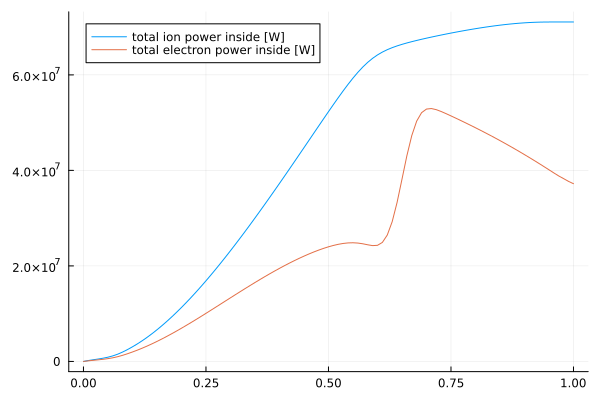

In [256]:
ts = IMAS.total_sources(dd.core_sources, dd.core_profiles.profiles_1d[],)

display(ts)

plot(ts.grid.rho_tor_norm,ts.total_ion_power_inside,label="total ion power inside [W]")
plot!(ts.grid.rho_tor_norm,ts.electrons.power_inside,label="total electron power inside [W]")

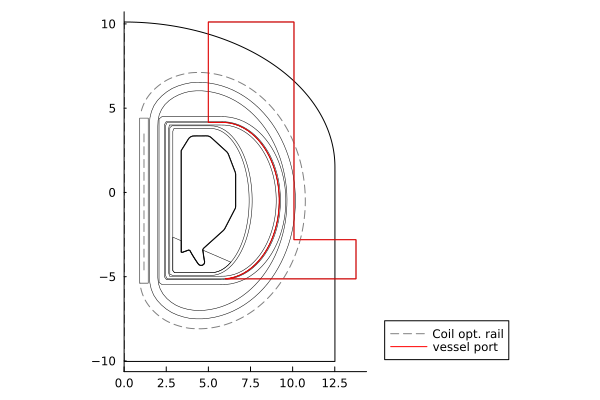

In [257]:
port = dd.build.structure[3]

plot(dd.build, wireframe=true)
plot!(dd.build.pf_active.rail)
plot!(port.outline.r, port.outline.z, color=:red, label="vessel port")
